<a href="https://colab.research.google.com/github/Ehsan-Rezaei97/NN/blob/main/ANN(ACP)_Ehsan_REZAEI_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preperation 
first we test that if we using gpu to calculate 
I chose GPU over Cpu since gpu has lot of core and it's better for parallel calculations 

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


for faster reload data I decidecided to use my google drive for excel files

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')

panda library is added since I gonna use data fram

numpy library is for doing maxrix calculations 

matplotlib to plot

keras to use ANN

sklearn to split test data and trains 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import train_test_split
from google.colab import data_table

we add excel file with panda package 

In [ ]:
dataset = pd.read_excel('/content/gdrive/MyDrive/Colab Notebooks/ANN - factory_process_ACP.xlsx')
pd.set_option('display.max_rows', 100)
# print whole sheet data

data_table.DataTable(dataset, include_index=False, num_rows_per_page=10 , max_columns=100)# just show data to debug 


,Humidity,Temperature,"Machine1,RawMaterial,Property1","Machine1,RawMaterial,Property2","Machine1,RawMaterial,Property3","Machine1,RawMaterial,Property4","Machine1,RawMaterialFeederParameter,U,Actual","Machine1,Zone1Temperature,C,Actual","Machine1,Zone2Temperature,C,Actual","Machine1,MotorAmperage,U,Actual","Machine1,MotorRPM,C,Actual","Machine1,MaterialPressure,U,Actual","Machine1,MaterialTemperature,U,Actual","Machine1,ExitZoneTemperature,C,Actual","Machine2,RawMaterial,Property1","Machine2,RawMaterial,Property2","Machine2,RawMaterial,Property3","Machine2,RawMaterial,Property4","Machine2,RawMaterialFeederParameter,U,Actual","Machine2,Zone1Temperature,C,Actual","Machine2,Zone2Temperature,C,Actual","Machine2,MotorAmperage,U,Actual","Machine2,MotorRPM,C,Actual","Machine2,MaterialPressure,U,Actual","Machine2,MaterialTemperature,U,Actual","Machine2,ExitZoneTemperature,C,Actual","Machine3,RawMaterial,Property1","Machine3,RawMaterial,Property2","Machine3,RawMaterial,Property3","Machine3,RawMaterial,Property4","Machine3,RawMaterialFeederParameter,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine3,Zone2Temperature,C,Actual","Machine3,MotorAmperage,U,Actual","Machine3,MotorRPM,C,Actual","Machine3,MaterialPressure,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","FirstStage,CombinerOperation,Temperature2,U,Actual","FirstStage,CombinerOperation,Temperature3,C,Actual",Delta KC1,Delta KC2,Delta KC3,Delta KC4,Delta KC5,Delta KC6,Delta KC7,Delta KC8,Delta KC9,Delta KC10,Delta KC11,Delta KC12
0,17.24,23.53,11.54,200,963,247,1207.77,72.3,72.7,49.37,10.52,431.12,77.3,75.1,12.59,236,601.11,257,216.81,69.01,69.83,72.69,13.89,238.57,70.2,60.0,9.02,186,421.16,200,203.06,78.0,78.3,350.62,13.78,252.89,65.7,65.1,103.1,111.6,80.0,-1.05,-11.46,-1.54,0.09,-1.38,-2.74,-0.17,-0.09,-0.65,-2.09,-0.76,-0.75
1,17.24,23.53,11.54,200,963,247,1134.89,72.3,72.7,48.84,10.52,427.93,77.3,75.1,12.59,236,601.11,257,219.04,68.98,69.69,73.13,13.89,237.43,70.1,60.1,9.02,186,421.16,200,234.30,78.1,78.3,342.60,13.55,253.52,65.8,65.1,103.1,111.1,80.0,-1.05,-11.46,-1.54,0.09,-1.38,-2.74,-0.17,-0.09,-0.65,-2.09,-0.76,-0.75
2,17.24,23.53,11.54,200,963,247,1246.27,72.3,72.7,48.97,10.48,433.71,77.3,75.1,12.59,236,601.11,257,199.11,68.98,69.72,72.75,13.94,240.87,70.3,60.1,9.02,186,421.16,200,214.71,78.1,78.3,334.36,13.53,252.85,65.8,65.1,103.1,111.5,80.0,-1.05,-11.46,-1.54,0.09,-1.38,-2.74,-0.17,-0.09,-0.65,-2.09,-0.76,-0.75
3,17.24,23.53,11.54,200,963,247,1246.37,72.3,72.7,48.70,10.45,430.82,77.4,75.1,12.59,236,601.11,257,194.29,68.97,69.72,72.38,13.93,243.37,70.4,60.1,9.02,186,421.16,200,194.20,78.1,78.3,345.07,13.62,252.40,65.8,65.1,103.4,111.8,80.0,-1.02,-11.41,-1.46,0.05,-1.36,-2.74,-0.18,-0.09,-0.58,-2.07,-0.72,-0.74
4,17.24,23.53,11.54,200,963,247,1247.26,72.3,72.7,49.10,10.52,439.28,77.4,75.1,12.59,236,601.11,257,230.32,68.97,69.71,72.63,13.90,242.82,70.1,60.2,9.02,186,421.16,200,196.54,78.1,78.3,341.41,13.47,252.13,65.8,65.1,103.4,111.6,80.0,-1.02,-11.41,-1.46,0.05,-1.36,-2.74,-0.18,-0.09,-0.58,-2.07,-0.72,-0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,16.73,24.09,11.54,200,963,247,1260.05,72.0,72.3,73.05,10.52,410.36,81.1,75.0,12.85,241,556.70,256,213.07,69.01,69.08,73.63,13.95,228.85,77.1,59.8,9.02,186,421.16,200,174.94,78.1,78.1,336.79,13.75,235.08,73.5,65.0,103.7,63.5,80.0,-0.66,-8.70,-2.23,-0.44,0.84,-2.74,-2.41,-0.07,-0.36,-0.59,-0.71,-0.35
805,16.73,24.09,11.54,200,963,247,1265.98,72.0,72.3,73.05,10.48,418.19,81.1,75.0,12.85,241,556.70,256,221.42,69.00,69.09,73.19,13.91,229.83,77.1,59.8,9.02,186,421.16,200,193.75,78.1,78.1,334.52,13.50,235.13,73.5,65.0,103.7,63.8,80.0,-0.66,-8.70,-2.23,-0.44,0.84,-2.74,-2.41,-0.07,-0.36,-0.59,-0.71,-0.35
806,16.73,24.09,11.54,200,963,247,1257.27,72.0,72.3,7

# Data Cleaning

we remove unwanted columns 

we just need Conformity7

In [ ]:
for i in range(1, 13):
    if i == 7:
        pass
    else:
        dataset = dataset.drop('Delta KC{}'.format(i), axis=1)
data_table.DataTable(dataset, include_index=False, num_rows_per_page=10 , max_columns=100)

,Humidity,Temperature,"Machine1,RawMaterial,Property1","Machine1,RawMaterial,Property2","Machine1,RawMaterial,Property3","Machine1,RawMaterial,Property4","Machine1,RawMaterialFeederParameter,U,Actual","Machine1,Zone1Temperature,C,Actual","Machine1,Zone2Temperature,C,Actual","Machine1,MotorAmperage,U,Actual","Machine1,MotorRPM,C,Actual","Machine1,MaterialPressure,U,Actual","Machine1,MaterialTemperature,U,Actual","Machine1,ExitZoneTemperature,C,Actual","Machine2,RawMaterial,Property1","Machine2,RawMaterial,Property2","Machine2,RawMaterial,Property3","Machine2,RawMaterial,Property4","Machine2,RawMaterialFeederParameter,U,Actual","Machine2,Zone1Temperature,C,Actual","Machine2,Zone2Temperature,C,Actual","Machine2,MotorAmperage,U,Actual","Machine2,MotorRPM,C,Actual","Machine2,MaterialPressure,U,Actual","Machine2,MaterialTemperature,U,Actual","Machine2,ExitZoneTemperature,C,Actual","Machine3,RawMaterial,Property1","Machine3,RawMaterial,Property2","Machine3,RawMaterial,Property3","Machine3,RawMaterial,Property4","Machine3,RawMaterialFeederParameter,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine3,Zone2Temperature,C,Actual","Machine3,MotorAmperage,U,Actual","Machine3,MotorRPM,C,Actual","Machine3,MaterialPressure,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","FirstStage,CombinerOperation,Temperature2,U,Actual","FirstStage,CombinerOperation,Temperature3,C,Actual",Delta KC7
0,17.24,23.53,11.54,200,963,247,1207.77,72.3,72.7,49.37,10.52,431.12,77.3,75.1,12.59,236,601.11,257,216.81,69.01,69.83,72.69,13.89,238.57,70.2,60.0,9.02,186,421.16,200,203.06,78.0,78.3,350.62,13.78,252.89,65.7,65.1,103.1,111.6,80.0,-0.17
1,17.24,23.53,11.54,200,963,247,1134.89,72.3,72.7,48.84,10.52,427.93,77.3,75.1,12.59,236,601.11,257,219.04,68.98,69.69,73.13,13.89,237.43,70.1,60.1,9.02,186,421.16,200,234.30,78.1,78.3,342.60,13.55,253.52,65.8,65.1,103.1,111.1,80.0,-0.17
2,17.24,23.53,11.54,200,963,247,1246.27,72.3,72.7,48.97,10.48,433.71,77.3,75.1,12.59,236,601.11,257,199.11,68.98,69.72,72.75,13.94,240.87,70.3,60.1,9.02,186,421.16,200,214.71,78.1,78.3,334.36,13.53,252.85,65.8,65.1,103.1,111.5,80.0,-0.17
3,17.24,23.53,11.54,200,963,247,1246.37,72.3,72.7,48.70,10.45,430.82,77.4,75.1,12.59,236,601.11,257,194.29,68.97,69.72,72.38,13.93,243.37,70.4,60.1,9.02,186,421.16,200,194.20,78.1,78.3,345.07,13.62,252.40,65.8,65.1,103.4,111.8,80.0,-0.18
4,17.24,23.53,11.54,200,963,247,1247.26,72.3,72.7,49.10,10.52,439.28,77.4,75.1,12.59,236,601.11,257,230.32,68.97,69.71,72.63,13.90,242.82,70.1,60.2,9.02,186,421.16,200,196.54,78.1,78.3,341.41,13.47,252.13,65.8,65.1,103.4,111.6,80.0,-0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,16.73,24.09,11.54,200,963,247,1260.05,72.0,72.3,73.05,10.52,410.36,81.1,75.0,12.85,241,556.70,256,213.07,69.01,69.08,73.63,13.95,228.85,77.1,59.8,9.02,186,421.16,200,174.94,78.1,78.1,336.79,13.75,235.08,73.5,65.0,103.7,63.5,80.0,-2.41
805,16.73,24.09,11.54,200,963,247,1265.98,72.0,72.3,73.05,10.48,418.19,81.1,75.0,12.85,241,556.70,256,221.42,69.00,69.09,73.19,13.91,229.83,77.1,59.8,9.02,186,421.16,200,193.75,78.1,78.1,334.52,13.50,235.13,73.5,65.0,103.7,63.8,80.0,-2.41
806,16.73,24.09,11.54,200,963,247,1257.27,72.0,72.3,72.78,10.48,410.52,81.1,75.0,12.85,241,556.70,256,188.97,69.00,69.09,73.38,13.86,226.63,76.9,59.9,9.02,186,421.16,200,185.56,78.1,78.1,335.93,13.70,235.51,73.5,65.0,103.7,63.4,80.0,-2.42
807,16.73,24.09,11.54,200,963,247,1262.36,72.0,72.2,73.59,10.52,416.21,81.1,75.0,12.85,241,556.70,256,211.19,69.01,69.09,73.63,13.86,224.80,77.1,59.9,9.02,186,421.16,200,194.74,78.1,78.1,335.09,13.68,235.10,73.5,65.0,103.6,63.7,80.0,-2.42


to control afect of variables we need to normalize our data

\begin{equation}


Z\, = \,\frac{{x\, - \,\mu }}{\partial }% MathType!End!2!1!


\end{equation}

we dont need to normal target since it's binary


In [ ]:
deviation = np.std(dataset, axis=0)
mean = dataset.mean(axis=0)

for i, dev_i in enumerate(deviation):
    if dev_i != 0:
        normdata = (dataset.iloc[:, i] - mean[i]) / dev_i
        dataset.iloc[:, i] = normdata
print(mean,"\n---------------------------------------------------------")
print(deviation)


In [ ]:
dimm = 13 # after som test we decied to continue with cor grathar than 0.5
most_correlated = dataset.corr(method ='pearson').abs()['Delta KC7'].sort_values(ascending=False)

most_correlated = most_correlated[:dimm+1]
   
dataset = dataset.loc[:, most_correlated.index]
x = dataset.drop('Delta KC7', axis=1)# we separate parameters from target
y = dataset['Delta KC7']

print(most_correlated)# jost for debug

Delta KC7                                             1.000000
FirstStage,CombinerOperation,Temperature2,U,Actual    0.974665
Machine1,MotorAmperage,U,Actual                       0.936108
Machine2,MaterialTemperature,U,Actual                 0.921061
Temperature                                           0.901530
Machine3,MaterialPressure,U,Actual                    0.898426
Humidity                                              0.873290
Machine1,MaterialTemperature,U,Actual                 0.860172
Machine3,MaterialTemperature,U,Actual                 0.855043
Machine3,Zone1Temperature,C,Actual                    0.793439
Machine2,MaterialPressure,U,Actual                    0.731805
Machine3,ExitZoneTemperature,C,Actual                 0.615095
FirstStage,CombinerOperation,Temperature1,U,Actual    0.527675
Machine1,ExitZoneTemperature,C,Actual                 0.522447
Name: Delta KC7, dtype: float64


In [ ]:
data_table.DataTable(x, include_index=False, num_rows_per_page=10 , max_columns=100)

,"FirstStage,CombinerOperation,Temperature2,U,Actual","Machine1,MotorAmperage,U,Actual","Machine2,MaterialTemperature,U,Actual",Temperature,"Machine3,MaterialPressure,U,Actual",Humidity,"Machine1,MaterialTemperature,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine2,MaterialPressure,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","Machine1,ExitZoneTemperature,C,Actual"
0,1.838740,-1.722172,-2.907272,-1.644669,3.145842,1.565886,-3.435943,-1.979001,-0.491391,2.168322,0.816114,-1.991196,1.004015
1,1.810959,-1.766383,-2.963048,-1.644669,3.310687,1.565886,-3.435943,-1.930780,0.107307,1.876143,0.816114,-1.991196,1.004015
2,1.833184,-1.755539,-2.851496,-1.644669,3.135375,1.565886,-3.435943,-1.930780,0.107307,2.757808,0.816114,-1.991196,1.004015
3,1.849853,-1.778061,-2.795720,-1.644669,3.017629,1.565886,-3.326130,-1.930780,0.107307,3.398553,0.816114,-1.717138,1.004015
4,1.838740,-1.744694,-2.963048,-1.644669,2.946981,1.565886,-3.326130,-1.930780,0.107307,3.257589,0.816114,-1.717138,1.004015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,-0.833883,0.253138,0.941275,1.137946,-1.514304,-0.918135,0.736923,1.782218,0.107307,-0.322894,-0.417972,-1.443081,-0.464788
805,-0.817214,0.253138,0.941275,1.137946,-1.501221,-0.918135,0.736923,1.782218,0.107307,-0.071722,-0.417972,-1.443081,-0.464788
806,-0.839439,0.230615,0.829723,1.137946,-1.401791,-0.918135,0.736923,1.782218,0.107307,-0.891876,-0.417972,-1.443081,-0.464788
807,-0.822770,0.298183,0.941275,1.137946,-1.509071,-0.918135,0.736923,1.782218,0.107307,-1.360901,-0.417972,-1.534433,-0.464788


In [ ]:
print(y)

0      1.858678
1      1.858678
2      1.858678
3      1.846930
4      1.846930
         ...   
804   -0.772734
805   -0.772734
806   -0.784482
807   -0.784482
808   -0.784482
Name: Delta KC7, Length: 809, dtype: float64


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.1)
x_train_NumberOfRows = x_train.shape[0]
x_train_NumberOfColumns = x_train.shape[1]
data_table.DataTable(x_train, include_index=False, num_rows_per_page=10 , max_columns=100)



,"FirstStage,CombinerOperation,Temperature2,U,Actual","Machine1,MotorAmperage,U,Actual","Machine2,MaterialTemperature,U,Actual",Temperature,"Machine3,MaterialPressure,U,Actual",Humidity,"Machine1,MaterialTemperature,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine2,MaterialPressure,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","Machine1,ExitZoneTemperature,C,Actual"
455,-0.411597,0.680232,0.327739,-0.004914,-0.279274,0.153404,0.297674,0.046271,-0.491391,-1.091788,-0.417972,0.201265,-0.464788
114,1.844297,-2.070020,-1.401319,-1.644669,1.332545,1.565886,-1.129885,-1.400352,1.903399,-0.225501,0.816114,-0.803613,1.004015
51,1.855410,-1.878995,-2.237959,-1.644669,1.947444,1.565886,-2.447632,-1.737897,2.502097,2.176011,0.816114,-1.260375,1.004015
635,-0.511612,0.477529,0.662395,1.137946,-0.703161,-0.918135,0.627111,0.769582,-0.491391,-1.181493,-0.417972,0.749380,-0.464788
778,-0.833883,0.197249,0.829723,1.137946,-1.299744,-0.918135,0.627111,1.733997,0.107307,-1.527495,-0.417972,-1.625786,-0.464788
...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,-0.417154,0.579297,0.439291,-0.004914,-0.287124,0.153404,0.407486,0.046271,-0.491391,-0.156301,-0.417972,0.109913,-0.464788
293,-0.483830,0.612664,0.271963,-0.004914,0.055650,0.153404,0.407486,-0.194833,-0.491391,-0.702215,-0.417972,-0.072793,1.004015
654,-0.506056,0.410796,0.662395,1.137946,-0.593264,-0.918135,0.517299,0.769582,-0.491391,-0.881624,-0.417972,0.840733,-1.933591
105,1.883192,-2.070020,-1.457095,-1.644669,1.513090,1.565886,-1.239698,-1.400352,1.903399,0.643349,0.816114,-1.169023,1.004015


In [ ]:
data_table.DataTable(x_test, include_index=False, num_rows_per_page=10 , max_columns=100)

,"FirstStage,CombinerOperation,Temperature2,U,Actual","Machine1,MotorAmperage,U,Actual","Machine2,MaterialTemperature,U,Actual",Temperature,"Machine3,MaterialPressure,U,Actual",Humidity,"Machine1,MaterialTemperature,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine2,MaterialPressure,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","Machine1,ExitZoneTemperature,C,Actual"
166,1.877635,-1.295078,-0.955110,-1.644669,0.921741,1.565886,-0.471012,-1.159248,1.304702,0.945781,2.050201,-0.620908,1.004015
261,-0.506056,0.556775,0.160411,-0.004914,-0.088263,0.153404,0.297674,-0.243054,-0.491391,0.130753,-1.652059,-0.164145,-0.464788
532,-0.511612,0.466685,0.550843,0.690740,-0.695311,-0.918135,0.517299,0.624920,-0.491391,0.017982,0.816114,1.480200,1.004015
491,-0.200455,0.590142,0.439291,0.342913,-0.292357,-0.918135,0.517299,0.094491,-0.491391,-0.622763,-1.652059,0.840733,-0.464788
158,1.877635,-1.642926,-0.955110,-1.644669,0.960990,1.565886,-0.471012,-1.159248,1.304702,-0.033277,2.050201,-0.620908,1.004015
194,-0.611627,0.702754,0.104635,-0.004914,0.110598,0.153404,0.297674,-0.339495,-0.491391,0.722802,-0.417972,-0.346850,1.004015
219,-0.544951,0.635187,0.160411,-0.004914,0.029484,0.153404,0.187862,-0.339495,-0.491391,0.594653,-0.417972,-0.346850,1.004015
214,-0.589402,0.600986,0.104635,-0.004914,0.019017,0.153404,0.297674,-0.339495,-0.491391,0.317851,-0.417972,-0.255498,1.004015
494,-0.228236,0.635187,0.439291,0.342913,-0.287124,-0.918135,0.517299,0.142712,-0.491391,-0.535622,-1.652059,0.932085,-0.464788
250,-0.506056,0.556775,0.216187,-0.004914,-0.075180,0.153404,0.187862,-0.291275,-0.491391,-0.571503,-1.652059,-0.255498,-0.464788


In [ ]:
print(y_train)

455   -0.455555
114    1.682467
51     1.752951
635   -0.314587
778   -0.937198
         ...   
457   -0.455555
293   -0.408566
654   -0.291092
105    1.741204
201   -0.385071
Name: Delta KC7, Length: 728, dtype: float64


In [ ]:
print(y_test)

166    1.999646
261   -0.396818
532   -0.725745
491   -0.420313
158    1.917415
194   -0.291092
219   -0.408566
214   -0.396818
494   -0.302839
250   -0.443808
648   -0.396818
670   -0.396818
610   -0.408566
678   -0.479050
286   -0.302839
527   -0.608271
552   -0.667008
671   -0.396818
717   -1.183893
216   -0.349829
617   -0.408566
11     1.976151
295   -0.361576
260   -0.396818
480   -0.396818
425   -0.396818
591   -0.549534
282   -0.514292
153    1.823436
568   -0.561282
627   -0.338082
571   -0.490797
581   -0.807977
462   -0.490797
406   -0.361576
644   -0.349829
519   -0.725745
238   -0.349829
212   -0.326334
438   -0.561282
20     1.752951
742   -0.760987
188   -0.349829
711   -1.313114
217   -0.279345
231   -0.361576
82     1.635478
401   -0.420313
658   -0.314587
589   -0.549534
248   -0.385071
369   -0.514292
177    2.140615
377   -0.408566
681   -0.385071
159    1.917415
164    1.999646
430   -0.373324
296   -0.361576
312   -0.420313
91     1.717709
32     1.893920
789   -0

# comparing Ann to others
first we creat Ann with just 1 hiden layer 

then we chang number of neurons from 10 to 80 in 10 by 10 step

then we find how many neurons is best for just 1 layer

Model: "sequential_160"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_589 (Dense)            (None, 13)                182       
_________________________________________________________________
dense_590 (Dense)            (None, 10)                140       
_________________________________________________________________
dense_591 (Dense)            (None, 1)                 11        
Total params: 333
Trainable params: 333
Non-trainable params: 0
_________________________________________________________________
Epoch 1/15
23/23 - 0s - loss: 0.9041 - acc: 0.0000e+00 - val_loss: 0.6482 - val_acc: 0.0000e+00
Epoch 2/15
23/23 - 0s - loss: 0.6898 - acc: 0.0000e+00 - val_loss: 0.5435 - val_acc: 0.0000e+00
Epoch 3/15
23/23 - 0s - loss: 0.5594 - acc: 0.0000e+00 - val_loss: 0.4467 - val_acc: 0.0000e+00
Epoch 4/15
23/23 - 0s - loss: 0.4203 - acc: 0.0000e+00 - val_loss: 0.3168 - val_acc: 0.0000e+00


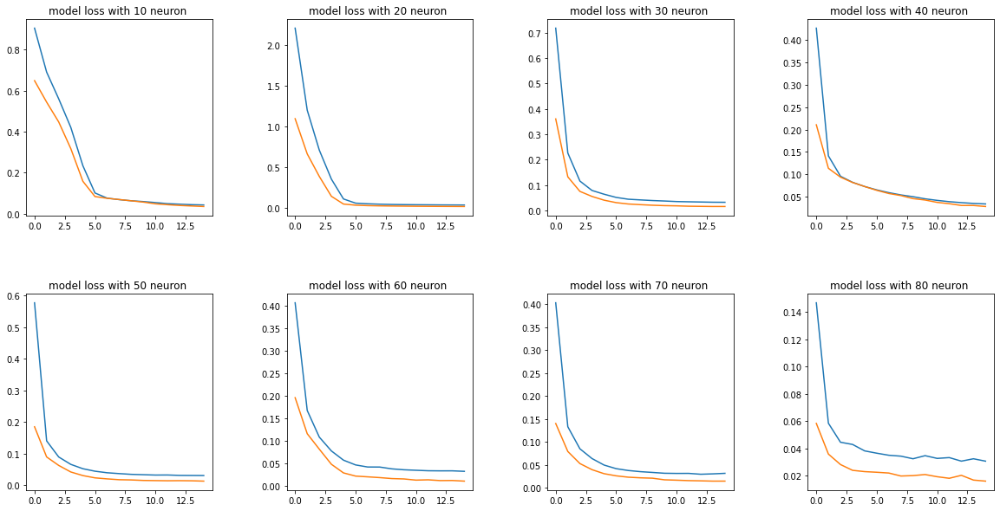

In [ ]:

minloos1 = 10 # we use it to find min of mse

plt.rcParams["figure.figsize"] = (20,10)#to plot more easily
fig = plt.figure()
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1,9):
  model = Sequential()
  model.add(Dense(dimm, input_dim=dimm, activation='relu'))# for this kind of rule (Rectified Linear Unit) is very good
  model.add(Dense(i*10, activation='relu'))# for this kind of rule (Rectified Linear Unit) is very good
  model.add(Dense(1, activation='linear'))# we have only 1 neuron and we use sigmoid since our target is 0 and 1
  model.compile(loss='mse', optimizer='adam', metrics=['acc'])#Adam optimization is a stochastic gradient descent method that is based on adaptive estimation of first-order and second-order moments.
  model.summary()

  history = model.fit(x_train, y_train, epochs=15, verbose=2,shuffle=True, validation_data=(x_test, y_test))# after some tries we know epochs is enough 
  predictions = model.predict(x_test)

  print(history.history.keys())
  mean_test_error = model.evaluate(x_test,y_test)# to extract mse and acc
  ax = fig.add_subplot(2,4,i)
  plt.title('model loss with {} neuron '.format(i*10))
  ax.plot(history.history['loss'])
  ax.plot(history.history['val_loss'])
  if minloos1 > mean_test_error[0] : # if we got better result than before then we change our answer to that
    model1= model
    minloos1 = mean_test_error[0] 
    accuracy1 = (1-mean_test_error[0])*100
    conter1 = i
    lo1=history.history['loss']
    ac1=history.history['val_loss']
    vl1=[1-x for x in history.history['loss']]
    va1=[1-x for x in history.history['val_loss']]
print("\n-------------------")
print("MSE = ",minloos1," and nmber of neuron = ", conter1*10," with accuracy = ",accuracy1)#it gives us best number of neuron in 1 layer
print("\n-------------------")



now we run code for 2 hiden layer

its same as the previous one except we add another layer

Model: "sequential_119"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_365 (Dense)            (None, 13)                182       
_________________________________________________________________
dense_366 (Dense)            (None, 10)                140       
_________________________________________________________________
dense_367 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_368 (Dense)            (None, 1)                 11        
Total params: 443
Trainable params: 443
Non-trainable params: 0
_________________________________________________________________
Epoch 1/15
23/23 - 1s - loss: 1.8264 - acc: 0.0000e+00 - val_loss: 1.3502 - val_acc: 0.0000e+00
Epoch 2/15
23/23 - 0s - loss: 0.8612 - acc: 0.0000e+00 - val_loss: 0.5244 - val_acc: 0.0000e+00
Epoch 3/15
23/23 - 0s - loss: 0.3251 - acc: 0.0000e+00 - val

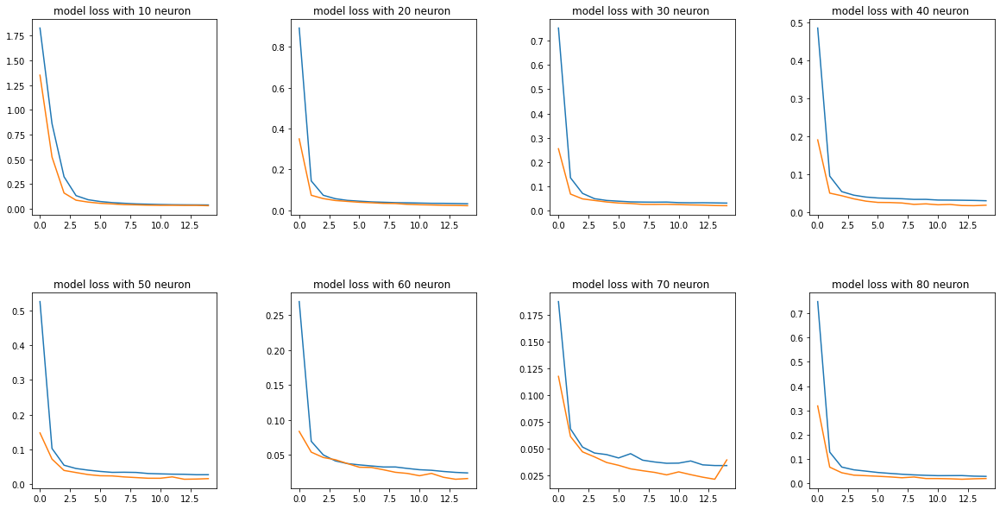

In [ ]:

minloos2 = 10

plt.rcParams["figure.figsize"] = (20,10)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1,9):
  model = Sequential()
  model.add(Dense(dimm, input_dim=dimm, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))#for middle layer rulu is better
  model.add(Dense(1, activation='linear'))
  model.compile(loss='mse', optimizer='adam', metrics=['acc'])
  model.summary()

  history = model.fit(x_train, y_train, epochs=15, verbose=2,shuffle=True, validation_data=(x_test, y_test))
  predictions = model.predict(x_test)

  print(history.history.keys())
  mean_test_error = model.evaluate(x_test,y_test)
  ax = fig.add_subplot(2,4,i)
  plt.title('model loss with {} neuron '.format(i*10))
  ax.plot(history.history['loss'])
  ax.plot(history.history['val_loss'])
  if minloos2 > mean_test_error[0] :
    model2= model
    minloos2 = mean_test_error[0] 
    accuracy2 = (1-mean_test_error[0])*100
    conter2 = i
    lo2=history.history['loss']
    ac2=history.history['val_loss']
    vl2=[1-x for x in history.history['loss']]
    va2=[1-x for x in history.history['val_loss']]
print("\n-------------------")
print("MSE = ",minloos2," and nmber of neuron = ", conter2*10," with accuracy = ",accuracy2)
print("\n-------------------")



now we run code for 2 hiden layer

its same as the previous one except we add another layer

Model: "sequential_127"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_397 (Dense)            (None, 13)                182       
_________________________________________________________________
dense_398 (Dense)            (None, 10)                140       
_________________________________________________________________
dense_399 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_400 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_401 (Dense)            (None, 1)                 11        
Total params: 553
Trainable params: 553
Non-trainable params: 0
_________________________________________________________________
dict_keys(['loss', 'acc', 'val_loss', 'val_acc'])
3/3 [==============================] - 0s 3ms/step - loss: 0.0312 - ac

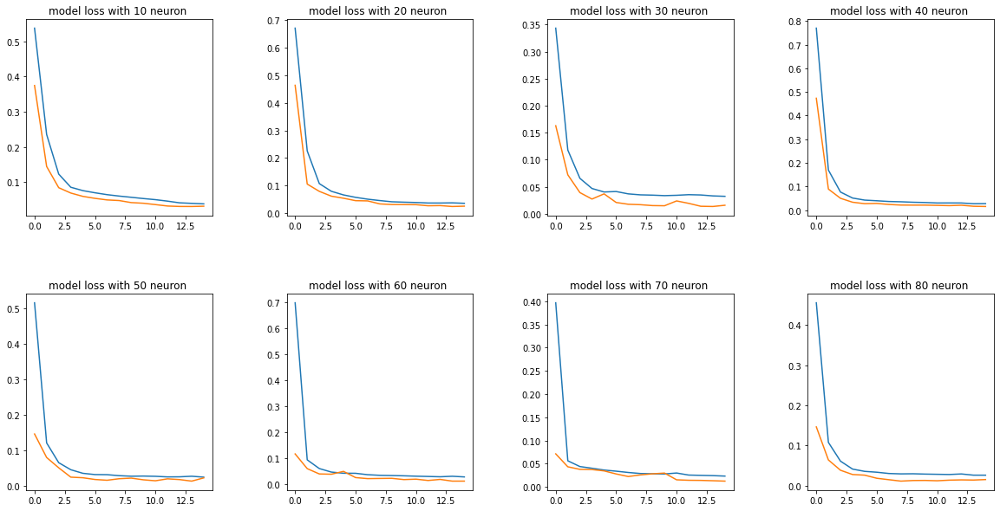

In [ ]:

minloos3 = 10

plt.rcParams["figure.figsize"] = (20,10)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1,9):
  model = Sequential()
  model.add(Dense(dimm, input_dim=dimm, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(1, activation='linear'))
  model.compile(loss='mse', optimizer='adam', metrics=['acc'])
  model.summary()

  history = model.fit(x_train, y_train, epochs=15, verbose=2,shuffle=True, validation_data=(x_test, y_test))
  predictions = model.predict(x_test)

  print(history.history.keys())
  mean_test_error = model.evaluate(x_test,y_test)
  ax = fig.add_subplot(2,4,i)
  plt.title('model loss with {} neuron '.format(i*10))
  ax.plot(history.history['loss'])
  ax.plot(history.history['val_loss'])
  if minloos3 > mean_test_error[0] :
    model3= model
    minloos3 = mean_test_error[0] 
    accuracy3 = (1-mean_test_error[0])*100
    conter3 = i
    lo3=history.history['loss']
    ac3=history.history['val_loss']
    vl3=[1-x for x in history.history['loss']]
    va3=[1-x for x in history.history['val_loss']]
print("\n-------------------")
print("MSE = ",minloos3," and nmber of neuron = ", conter3*10," with accuracy = ",accuracy3)
print("\n-------------------")



now we run code for 2 hiden layer

its same as the previous one except we add another layer

Model: "sequential_135"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_437 (Dense)            (None, 13)                182       
_________________________________________________________________
dense_438 (Dense)            (None, 10)                140       
_________________________________________________________________
dense_439 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_440 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_441 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_442 (Dense)            (None, 1)                 11        
Total params: 663
Trainable params: 663
Non-trainable params: 0
______________________________________________________

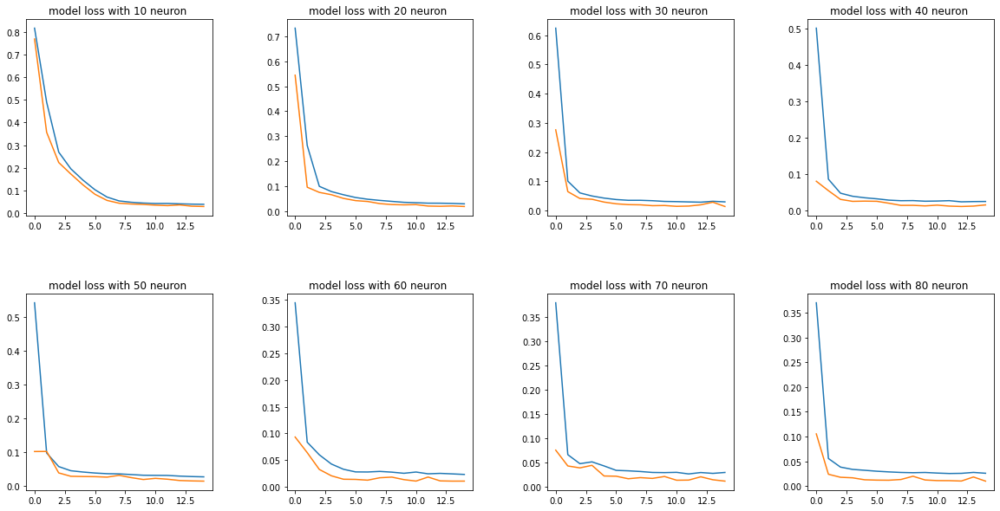

In [ ]:

minloos4 = 10

plt.rcParams["figure.figsize"] = (20,10)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1,9):
  model = Sequential()
  model.add(Dense(dimm, input_dim=dimm, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(1, activation='linear'))
  model.compile(loss='mse', optimizer='adam', metrics=['acc'])
  model.summary()

  history = model.fit(x_train, y_train, epochs=15, verbose=2,shuffle=True, validation_data=(x_test, y_test))
  predictions = model.predict(x_test)

  print(history.history.keys())
  mean_test_error = model.evaluate(x_test,y_test)
  ax = fig.add_subplot(2,4,i)
  plt.title('model loss with {} neuron '.format(i*10))
  ax.plot(history.history['loss'])
  ax.plot(history.history['val_loss'])
  if minloos4 > mean_test_error[0] :
    model4= model
    minloos4 = mean_test_error[0] 
    accuracy4 = (1-mean_test_error[0])*100
    conter4 = i
    lo4=history.history['loss']
    ac4=history.history['val_loss']
    vl4=[1-x for x in history.history['loss']]
    va4=[1-x for x in history.history['val_loss']]
print("\n-------------------")
print("MSE = ",minloos4," and nmber of neuron = ", conter4*10," with accuracy = ",accuracy4)
print("\n-------------------")





now we run code for 2 hiden layer

its same as the previous one except we add another layer

Model: "sequential_143"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_485 (Dense)            (None, 13)                182       
_________________________________________________________________
dense_486 (Dense)            (None, 10)                140       
_________________________________________________________________
dense_487 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_488 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_489 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_490 (Dense)            (None, 10)                110       
_________________________________________________________________
dense_491 (Dense)            (None, 1)              

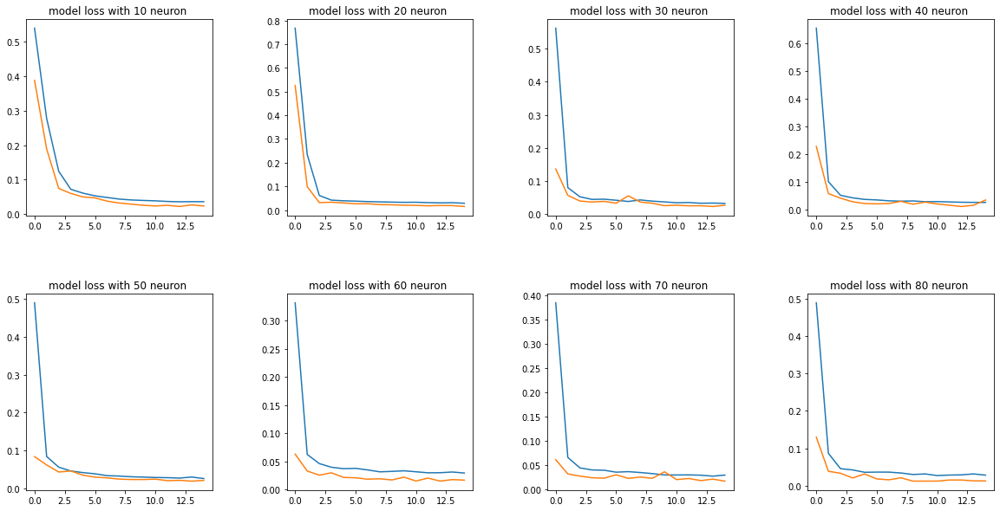

In [ ]:

minloos5 = 10

plt.rcParams["figure.figsize"] = (20,10)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(1,9):
  model = Sequential()
  model.add(Dense(dimm, input_dim=dimm, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(i*10, activation='relu'))
  model.add(Dense(1, activation='linear'))
  model.compile(loss='mse', optimizer='adam', metrics=['acc'])
  model.summary()

  history = model.fit(x_train, y_train, epochs=15, verbose=2,shuffle=True, validation_data=(x_test, y_test))
  predictions = model.predict(x_test)

  print(history.history.keys())
  mean_test_error = model.evaluate(x_test,y_test)
  ax = fig.add_subplot(2,4,i)
  plt.title('model loss with {} neuron '.format(i*10))
  ax.plot(history.history['loss'])
  ax.plot(history.history['val_loss'])
  if minloos5 > mean_test_error[0] :
    model5= model
    minloos5 = mean_test_error[0] 
    accuracy5 = (1-mean_test_error[0])*100
    conter5 = i
    lo5=history.history['loss']
    ac5=history.history['val_loss']
    vl5=[1-x for x in history.history['loss']]
    va5=[1-x for x in history.history['val_loss']]
print("\n-------------------")
print("MSE = ",minloos5," and nmber of neuron = ", conter5*10," with accuracy = ",accuracy5)
print("\n-------------------")




# Comparing
now we compare best of layers with each others


In [ ]:
print("\n MSE = ",minloos1," and nmber of neuron = ", conter1*10," with accuracy = ",accuracy1 , " with 1 hiden layer")
print("\n MSE = ",minloos2," and nmber of neuron = ", conter2*10," with accuracy = ",accuracy2, " with 2 hiden layer")
print("\n MSE = ",minloos3," and nmber of neuron = ", conter3*10," with accuracy = ",accuracy3, " with 3 hiden layer")
print("\n MSE = ",minloos4," and nmber of neuron = ", conter4*10," with accuracy = ",accuracy4, " with 4 hiden layer")
print("\n MSE = ",minloos5," and nmber of neuron = ", conter5*10," with accuracy = ",accuracy5, " with 5 hiden layer")


 MSE =  0.018501557409763336  and nmber of neuron =  70  with accuracy =  98.14984425902367  with 1 hiden layer

 MSE =  0.01632462628185749  and nmber of neuron =  60  with accuracy =  98.36753737181425  with 2 hiden layer

 MSE =  0.012327093631029129  and nmber of neuron =  60  with accuracy =  98.76729063689709  with 3 hiden layer

 MSE =  0.009717314504086971  and nmber of neuron =  80  with accuracy =  99.0282685495913  with 4 hiden layer

 MSE =  0.013092773966491222  and nmber of neuron =  80  with accuracy =  98.69072260335088  with 5 hiden layer


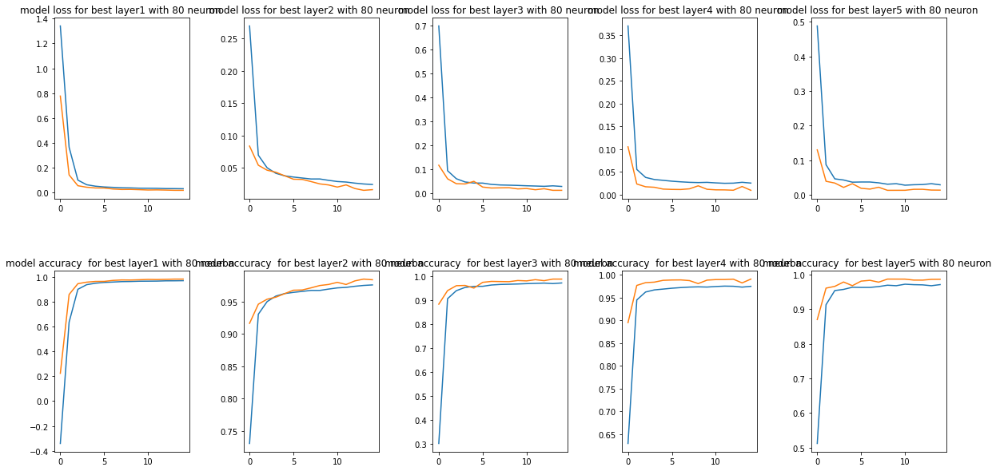

In [ ]:
plt.rcParams["figure.figsize"] = (20,10)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)


ax = fig.add_subplot(2,5,1)
plt.title('model loss for best layer1 with {} neuron '.format(i*10))
ax.plot(lo1)
ax.plot(ac1)
ax = fig.add_subplot(2,5,6)
plt.title('model accuracy  for best layer1 with {} neuron '.format(i*10))
ax.plot(vl1)
ax.plot(va1)

ax = fig.add_subplot(2,5,2)
plt.title('model loss for best layer2 with {} neuron '.format(i*10))
ax.plot(lo2)
ax.plot(ac2)
ax = fig.add_subplot(2,5,7)
plt.title('model accuracy  for best layer2 with {} neuron '.format(i*10))
ax.plot(vl2)
ax.plot(va2)

ax = fig.add_subplot(2,5,3)
plt.title('model loss for best layer3 with {} neuron '.format(i*10))
ax.plot(lo3)
ax.plot(ac3)
ax = fig.add_subplot(2,5,8)
plt.title('model accuracy  for best layer3 with {} neuron '.format(i*10))
ax.plot(vl3)
ax.plot(va3)

ax = fig.add_subplot(2,5,4)
plt.title('model loss for best layer4 with {} neuron '.format(i*10))
ax.plot(lo4)
ax.plot(ac4)
ax = fig.add_subplot(2,5,9)
plt.title('model accuracy  for best layer4 with {} neuron '.format(i*10))
ax.plot(vl4)
ax.plot(va4)

ax = fig.add_subplot(2,5,5)
plt.title('model loss for best layer5 with {} neuron '.format(i*10))
ax.plot(lo5)
ax.plot(ac5)
ax = fig.add_subplot(2,5,10)
plt.title('model accuracy  for best layer5 with {} neuron '.format(i*10))
ax.plot(vl5)
ax.plot(va5)



In [ ]:
dataset = pd.read_excel('/content/gdrive/MyDrive/Colab Notebooks/ANN - factory_process_ACP.xlsx')
pd.set_option('display.max_rows', 100)
# print whole sheet data

data_table.DataTable(dataset, include_index=False, num_rows_per_page=10 , max_columns=100)


,Humidity,Temperature,"Machine1,RawMaterial,Property1","Machine1,RawMaterial,Property2","Machine1,RawMaterial,Property3","Machine1,RawMaterial,Property4","Machine1,RawMaterialFeederParameter,U,Actual","Machine1,Zone1Temperature,C,Actual","Machine1,Zone2Temperature,C,Actual","Machine1,MotorAmperage,U,Actual","Machine1,MotorRPM,C,Actual","Machine1,MaterialPressure,U,Actual","Machine1,MaterialTemperature,U,Actual","Machine1,ExitZoneTemperature,C,Actual","Machine2,RawMaterial,Property1","Machine2,RawMaterial,Property2","Machine2,RawMaterial,Property3","Machine2,RawMaterial,Property4","Machine2,RawMaterialFeederParameter,U,Actual","Machine2,Zone1Temperature,C,Actual","Machine2,Zone2Temperature,C,Actual","Machine2,MotorAmperage,U,Actual","Machine2,MotorRPM,C,Actual","Machine2,MaterialPressure,U,Actual","Machine2,MaterialTemperature,U,Actual","Machine2,ExitZoneTemperature,C,Actual","Machine3,RawMaterial,Property1","Machine3,RawMaterial,Property2","Machine3,RawMaterial,Property3","Machine3,RawMaterial,Property4","Machine3,RawMaterialFeederParameter,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine3,Zone2Temperature,C,Actual","Machine3,MotorAmperage,U,Actual","Machine3,MotorRPM,C,Actual","Machine3,MaterialPressure,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","FirstStage,CombinerOperation,Temperature2,U,Actual","FirstStage,CombinerOperation,Temperature3,C,Actual",Delta KC1,Delta KC2,Delta KC3,Delta KC4,Delta KC5,Delta KC6,Delta KC7,Delta KC8,Delta KC9,Delta KC10,Delta KC11,Delta KC12
0,17.24,23.53,11.54,200,963,247,1207.77,72.3,72.7,49.37,10.52,431.12,77.3,75.1,12.59,236,601.11,257,216.81,69.01,69.83,72.69,13.89,238.57,70.2,60.0,9.02,186,421.16,200,203.06,78.0,78.3,350.62,13.78,252.89,65.7,65.1,103.1,111.6,80.0,-1.05,-11.46,-1.54,0.09,-1.38,-2.74,-0.17,-0.09,-0.65,-2.09,-0.76,-0.75
1,17.24,23.53,11.54,200,963,247,1134.89,72.3,72.7,48.84,10.52,427.93,77.3,75.1,12.59,236,601.11,257,219.04,68.98,69.69,73.13,13.89,237.43,70.1,60.1,9.02,186,421.16,200,234.30,78.1,78.3,342.60,13.55,253.52,65.8,65.1,103.1,111.1,80.0,-1.05,-11.46,-1.54,0.09,-1.38,-2.74,-0.17,-0.09,-0.65,-2.09,-0.76,-0.75
2,17.24,23.53,11.54,200,963,247,1246.27,72.3,72.7,48.97,10.48,433.71,77.3,75.1,12.59,236,601.11,257,199.11,68.98,69.72,72.75,13.94,240.87,70.3,60.1,9.02,186,421.16,200,214.71,78.1,78.3,334.36,13.53,252.85,65.8,65.1,103.1,111.5,80.0,-1.05,-11.46,-1.54,0.09,-1.38,-2.74,-0.17,-0.09,-0.65,-2.09,-0.76,-0.75
3,17.24,23.53,11.54,200,963,247,1246.37,72.3,72.7,48.70,10.45,430.82,77.4,75.1,12.59,236,601.11,257,194.29,68.97,69.72,72.38,13.93,243.37,70.4,60.1,9.02,186,421.16,200,194.20,78.1,78.3,345.07,13.62,252.40,65.8,65.1,103.4,111.8,80.0,-1.02,-11.41,-1.46,0.05,-1.36,-2.74,-0.18,-0.09,-0.58,-2.07,-0.72,-0.74
4,17.24,23.53,11.54,200,963,247,1247.26,72.3,72.7,49.10,10.52,439.28,77.4,75.1,12.59,236,601.11,257,230.32,68.97,69.71,72.63,13.90,242.82,70.1,60.2,9.02,186,421.16,200,196.54,78.1,78.3,341.41,13.47,252.13,65.8,65.1,103.4,111.6,80.0,-1.02,-11.41,-1.46,0.05,-1.36,-2.74,-0.18,-0.09,-0.58,-2.07,-0.72,-0.74
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,16.73,24.09,11.54,200,963,247,1260.05,72.0,72.3,73.05,10.52,410.36,81.1,75.0,12.85,241,556.70,256,213.07,69.01,69.08,73.63,13.95,228.85,77.1,59.8,9.02,186,421.16,200,174.94,78.1,78.1,336.79,13.75,235.08,73.5,65.0,103.7,63.5,80.0,-0.66,-8.70,-2.23,-0.44,0.84,-2.74,-2.41,-0.07,-0.36,-0.59,-0.71,-0.35
805,16.73,24.09,11.54,200,963,247,1265.98,72.0,72.3,73.05,10.48,418.19,81.1,75.0,12.85,241,556.70,256,221.42,69.00,69.09,73.19,13.91,229.83,77.1,59.8,9.02,186,421.16,200,193.75,78.1,78.1,334.52,13.50,235.13,73.5,65.0,103.7,63.8,80.0,-0.66,-8.70,-2.23,-0.44,0.84,-2.74,-2.41,-0.07,-0.36,-0.59,-0.71,-0.35
806,16.73,24.09,11.54,200,963,247,1257.27,72.0,72.3,7

In [ ]:
for i in range(1, 13):
    if i == 7 or i==2 or i==4:
        pass
    else:
        dataset = dataset.drop('Delta KC{}'.format(i), axis=1)
data_table.DataTable(dataset, include_index=False, num_rows_per_page=10 , max_columns=100)

,Humidity,Temperature,"Machine1,RawMaterial,Property1","Machine1,RawMaterial,Property2","Machine1,RawMaterial,Property3","Machine1,RawMaterial,Property4","Machine1,RawMaterialFeederParameter,U,Actual","Machine1,Zone1Temperature,C,Actual","Machine1,Zone2Temperature,C,Actual","Machine1,MotorAmperage,U,Actual","Machine1,MotorRPM,C,Actual","Machine1,MaterialPressure,U,Actual","Machine1,MaterialTemperature,U,Actual","Machine1,ExitZoneTemperature,C,Actual","Machine2,RawMaterial,Property1","Machine2,RawMaterial,Property2","Machine2,RawMaterial,Property3","Machine2,RawMaterial,Property4","Machine2,RawMaterialFeederParameter,U,Actual","Machine2,Zone1Temperature,C,Actual","Machine2,Zone2Temperature,C,Actual","Machine2,MotorAmperage,U,Actual","Machine2,MotorRPM,C,Actual","Machine2,MaterialPressure,U,Actual","Machine2,MaterialTemperature,U,Actual","Machine2,ExitZoneTemperature,C,Actual","Machine3,RawMaterial,Property1","Machine3,RawMaterial,Property2","Machine3,RawMaterial,Property3","Machine3,RawMaterial,Property4","Machine3,RawMaterialFeederParameter,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine3,Zone2Temperature,C,Actual","Machine3,MotorAmperage,U,Actual","Machine3,MotorRPM,C,Actual","Machine3,MaterialPressure,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","FirstStage,CombinerOperation,Temperature2,U,Actual","FirstStage,CombinerOperation,Temperature3,C,Actual",Delta KC2,Delta KC4,Delta KC7
0,17.24,23.53,11.54,200,963,247,1207.77,72.3,72.7,49.37,10.52,431.12,77.3,75.1,12.59,236,601.11,257,216.81,69.01,69.83,72.69,13.89,238.57,70.2,60.0,9.02,186,421.16,200,203.06,78.0,78.3,350.62,13.78,252.89,65.7,65.1,103.1,111.6,80.0,-11.46,0.09,-0.17
1,17.24,23.53,11.54,200,963,247,1134.89,72.3,72.7,48.84,10.52,427.93,77.3,75.1,12.59,236,601.11,257,219.04,68.98,69.69,73.13,13.89,237.43,70.1,60.1,9.02,186,421.16,200,234.30,78.1,78.3,342.60,13.55,253.52,65.8,65.1,103.1,111.1,80.0,-11.46,0.09,-0.17
2,17.24,23.53,11.54,200,963,247,1246.27,72.3,72.7,48.97,10.48,433.71,77.3,75.1,12.59,236,601.11,257,199.11,68.98,69.72,72.75,13.94,240.87,70.3,60.1,9.02,186,421.16,200,214.71,78.1,78.3,334.36,13.53,252.85,65.8,65.1,103.1,111.5,80.0,-11.46,0.09,-0.17
3,17.24,23.53,11.54,200,963,247,1246.37,72.3,72.7,48.70,10.45,430.82,77.4,75.1,12.59,236,601.11,257,194.29,68.97,69.72,72.38,13.93,243.37,70.4,60.1,9.02,186,421.16,200,194.20,78.1,78.3,345.07,13.62,252.40,65.8,65.1,103.4,111.8,80.0,-11.41,0.05,-0.18
4,17.24,23.53,11.54,200,963,247,1247.26,72.3,72.7,49.10,10.52,439.28,77.4,75.1,12.59,236,601.11,257,230.32,68.97,69.71,72.63,13.90,242.82,70.1,60.2,9.02,186,421.16,200,196.54,78.1,78.3,341.41,13.47,252.13,65.8,65.1,103.4,111.6,80.0,-11.41,0.05,-0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
804,16.73,24.09,11.54,200,963,247,1260.05,72.0,72.3,73.05,10.52,410.36,81.1,75.0,12.85,241,556.70,256,213.07,69.01,69.08,73.63,13.95,228.85,77.1,59.8,9.02,186,421.16,200,174.94,78.1,78.1,336.79,13.75,235.08,73.5,65.0,103.7,63.5,80.0,-8.70,-0.44,-2.41
805,16.73,24.09,11.54,200,963,247,1265.98,72.0,72.3,73.05,10.48,418.19,81.1,75.0,12.85,241,556.70,256,221.42,69.00,69.09,73.19,13.91,229.83,77.1,59.8,9.02,186,421.16,200,193.75,78.1,78.1,334.52,13.50,235.13,73.5,65.0,103.7,63.8,80.0,-8.70,-0.44,-2.41
806,16.73,24.09,11.54,200,963,247,1257.27,72.0,72.3,72.78,10.48,410.52,81.1,75.0,12.85,241,556.70,256,188.97,69.00,69.09,73.38,13.86,226.63,76.9,59.9,9.02,186,421.16,200,185.56,78.1,78.1,335.93,13.70,235.51,73.5,65.0,103.7,63.4,80.0,-8.58,-0.44,-2.42
807,16.73,24.09,11.54,200,963,247,1262.36,72.0,72.2,73.59,10.52,416.21,81.1,75.0,12.85,241,556.70,256,211.19,69.01,69.09,73.63,13.86,224.80,77.1,59.9,9.02,186,421.16,200,194.74,78.1,78.1,335.09,13.68,235.10,73.5,65.0,103.6,63.7,80.0,-8.58,-0.44,-2.42


In [ ]:
deviation = np.std(dataset, axis=0)
mean = dataset.mean(axis=0)

for i, dev_i in enumerate(deviation):
    if dev_i != 0:
        normdata = (dataset.iloc[:, i] - mean[i]) / dev_i
        dataset.iloc[:, i] = normdata
print(mean,"\n---------------------------------------------------------")
print(deviation)


Humidity                                                16.918504
Temperature                                             23.860989
Machine1,RawMaterial,Property1                          11.540000
Machine1,RawMaterial,Property2                         200.000000
Machine1,RawMaterial,Property3                         963.000000
Machine1,RawMaterial,Property4                         247.000000
Machine1,RawMaterialFeederParameter,U,Actual          1243.863592
Machine1,Zone1Temperature,C,Actual                      72.095426
Machine1,Zone2Temperature,C,Actual                      72.016718
Machine1,MotorAmperage,U,Actual                         70.015386
Machine1,MotorRPM,C,Actual                              10.498634
Machine1,MaterialPressure,U,Actual                     422.590159
Machine1,MaterialTemperature,U,Actual                   80.428925
Machine1,ExitZoneTemperature,C,Actual                   75.031644
Machine2,RawMaterial,Property1                          12.610247
Machine2,R

In [ ]:
dimm = 15
most_correlated = dataset.corr(method ='pearson').abs()['Delta KC7'].sort_values(ascending=False)

most_correlated = most_correlated[:dimm+1]
   
dataset = dataset.loc[:, most_correlated.index]
x1 = dataset.drop(['Delta KC2'], axis=1)
x1 =x1.drop(['Delta KC4'], axis=1)
x1 =x1.drop(['Delta KC7'], axis=1)
y1 = pd.DataFrame({'Delta KC2' : dataset['Delta KC2'] ,'Delta KC4': dataset['Delta KC4'],'Delta KC7': dataset['Delta KC7']})



print(most_correlated)

Delta KC7                                             1.000000
FirstStage,CombinerOperation,Temperature2,U,Actual    0.974665
Machine1,MotorAmperage,U,Actual                       0.936108
Machine2,MaterialTemperature,U,Actual                 0.921061
Temperature                                           0.901530
Machine3,MaterialPressure,U,Actual                    0.898426
Delta KC4                                             0.897257
Humidity                                              0.873290
Machine1,MaterialTemperature,U,Actual                 0.860172
Machine3,MaterialTemperature,U,Actual                 0.855043
Machine3,Zone1Temperature,C,Actual                    0.793439
Machine2,MaterialPressure,U,Actual                    0.731805
Machine3,ExitZoneTemperature,C,Actual                 0.615095
Delta KC2                                             0.605655
FirstStage,CombinerOperation,Temperature1,U,Actual    0.527675
Machine1,ExitZoneTemperature,C,Actual                 0

In [ ]:
y1

,Delta KC2,Delta KC4,Delta KC7
0,1.290388,1.808060,1.858678
1,1.290388,1.808060,1.858678
2,1.290388,1.808060,1.858678
3,1.299111,1.584995,1.846930
4,1.299111,1.584995,1.846930
...,...,...,...
804,1.771862,-1.147547,-0.772734
805,1.771862,-1.147547,-0.772734
806,1.792796,-1.147547,-0.784482
807,1.792796,-1.147547,-0.784482


In [ ]:
x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.2)
x1_train_NumberOfRows = x1_train.shape[0]
x1_train_NumberOfColumns = x1_train.shape[1]
data_table.DataTable(x1_train, include_index=False, num_rows_per_page=10 , max_columns=100)



,"FirstStage,CombinerOperation,Temperature2,U,Actual","Machine1,MotorAmperage,U,Actual","Machine2,MaterialTemperature,U,Actual",Temperature,"Machine3,MaterialPressure,U,Actual",Humidity,"Machine1,MaterialTemperature,U,Actual","Machine3,MaterialTemperature,U,Actual","Machine3,Zone1Temperature,C,Actual","Machine2,MaterialPressure,U,Actual","Machine3,ExitZoneTemperature,C,Actual","FirstStage,CombinerOperation,Temperature1,U,Actual","Machine1,ExitZoneTemperature,C,Actual"
526,-0.544951,0.556775,0.662395,0.690740,-0.501684,-0.918135,0.517299,0.624920,-0.491391,-0.771416,0.816114,1.206143,1.004015
752,-0.806101,0.298183,0.885499,1.137946,-1.116582,-0.918135,0.736923,1.733997,0.107307,-1.673585,-0.417972,-1.534433,-0.464788
583,-0.556063,0.421640,0.662395,0.690740,-0.690078,-0.918135,0.627111,0.721361,-0.491391,0.079494,-1.652059,1.206143,-0.464788
192,-0.611627,0.590142,0.104635,-0.004914,0.105365,0.153404,0.297674,-0.339495,-0.491391,-0.212686,-0.417972,-0.346850,1.004015
794,-0.833883,0.152203,0.829723,1.137946,-1.511687,-0.918135,0.736923,1.782218,0.107307,-1.635140,-0.417972,-1.625786,-0.464788
...,...,...,...,...,...,...,...,...,...,...,...,...,...
699,-0.450492,0.466685,0.662395,1.137946,-0.692695,-0.918135,0.517299,0.817803,-0.491391,-0.176804,-0.417972,1.023438,-0.464788
472,-0.289357,0.702754,0.327739,-0.004914,-0.294973,0.153404,0.407486,0.046271,-0.491391,-1.091788,-1.652059,1.754258,-0.464788
145,1.860966,-2.013297,-1.122438,-1.644669,0.971456,1.565886,-0.690636,-1.255690,1.304702,0.428059,2.050201,-0.894965,1.004015
660,-0.500500,0.477529,0.718171,1.137946,-0.705778,-0.918135,0.517299,0.817803,-0.491391,0.171761,-0.417972,1.023438,-1.933591


In [ ]:
model = Sequential()
model.add(Dense(13, input_dim=13, activation='relu'))
model.add(Dense(80, activation='relu'))
model.add(Dense(80, activation='relu'))
model.add(Dense(80, activation='relu'))
model.add(Dense(80, activation='relu'))
model.add(Dense(3, activation='linear'))
model.compile(loss='mse', optimizer='adam', metrics=['acc'])
model.summary()
history = model.fit(x1_train, y1_train, epochs=15, verbose=2,shuffle=True, validation_data=(x1_test, y1_test))
predictions = model.predict(x1_test)
print(history.history.keys())
mean_test_error = model.evaluate(x1_test,y1_test)
minloos6 = mean_test_error[0] 
model6= model
 
accuracy6 = mean_test_error[1]*100

lo6=history.history['loss']
ac6=history.history['val_loss']
vl6=history.history['acc']
va6=history.history['val_acc']
print("\n-------------------")
print("\n-------------------")
print("MSE = ",minloos6," and nmber of neuron = 80 with accuracy = ",accuracy6)
print("\n-------------------")


Model: "sequential_169"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_619 (Dense)            (None, 13)                182       
_________________________________________________________________
dense_620 (Dense)            (None, 80)                1120      
_________________________________________________________________
dense_621 (Dense)            (None, 80)                6480      
_________________________________________________________________
dense_622 (Dense)            (None, 80)                6480      
_________________________________________________________________
dense_623 (Dense)            (None, 80)                6480      
_________________________________________________________________
dense_624 (Dense)            (None, 3)                 243       
Total params: 20,985
Trainable params: 20,985
Non-trainable params: 0
________________________________________________

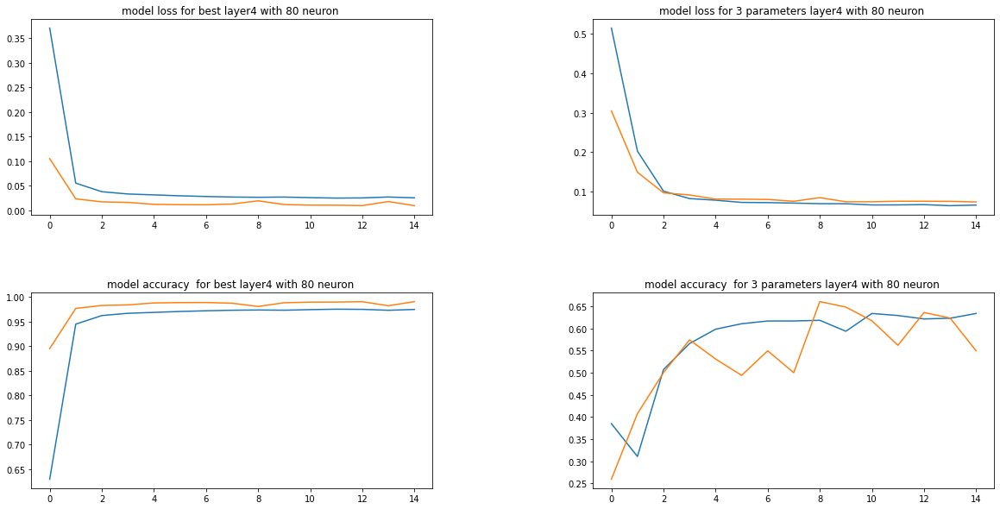

In [ ]:
plt.rcParams["figure.figsize"] = (20,10)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.4)


ax = fig.add_subplot(2,2,1)
plt.title('model loss for best layer4 with {} neuron '.format(i*10))
ax.plot(lo4)
ax.plot(ac4)
ax = fig.add_subplot(2,2,3)
plt.title('model accuracy  for best layer4 with {} neuron '.format(i*10))
ax.plot(vl4)
ax.plot(va4)

ax = fig.add_subplot(2,2,2)
plt.title('model loss for 3 parameters layer4 with {} neuron '.format(i*10))
ax.plot(lo6)
ax.plot(ac6)
ax = fig.add_subplot(2,2,4)
plt.title('model accuracy  for 3 parameters layer4 with {} neuron '.format(i*10))
ax.plot(vl6)
ax.plot(va6)

to get best result we need to have 4 hiden layer with 80 neurons 